<font style="font-size:96px; font-weight:bolder; color:#0040a0"><img src="http://montage.ipac.caltech.edu/docs/M51_logo.png" alt="M" style="float: left; padding: 25px 30px 25px 0px;" /></font>

<i><b>Montage</b> Montage is an astronomical image toolkit with components for reprojection, background matching, coaddition and visualization of FITS files. It can be used as a set of command-line tools (Linux, OS X and Windows), C library calls (Linux and OS X) and as Python binary extension modules.

The Montage source is written in ANSI-C and code can be downloaded from GitHub ( https://github.com/Caltech-IPAC/Montage ). The Python package can be installed from PyPI ("</i>pip install MontagePy<i>"). The package has no external dependencies. See http://montage.ipac.caltech.edu/ for details on the design and applications of Montage.


# MontagePy.main modules: mGetHdr and mPutHdr

FITS headers are both quite straightforward and fairly complicated.  The structure is straightforward, consisting of a sequence of 80-character "card" images in blocks of 2880 bytes at the beginning of the file and, in the case of multi-HDU files, at the beginning of each data block.  It is complicated because it can contain hundreds of parameters, all in a flat namespace.

On top of this, there is a specific subset of these parameters that define the structure of the data (row, columns, datatype) and the image projection and coordinate system.  Small errors, especially in this last subset, can make the file unusable.  When this happens, frequently the best way to fix things is to simply edit the header.

But since the header is in some respects binary (it is composed of ASCII characters but there are no newlines and the overall size must be an integer multiple of 2880 bytes), it can't be edited directly.

Instead, we have two Montage modules:  mGetHdr to extract the FITS header into an editable text file and mPutHdr to replace the FITS header with new data from an (edited) text file version, padding everything as needed.

In [4]:
from MontagePy.main import mGetHdr, mPutHdr, mViewer

help(mGetHdr)

Help on built-in function mGetHdr in module MontagePy.main:

mGetHdr(...)
    mGetHdr strips the header out of a FITS file into an easily-edited ASCII file.
    
    Parameters
    ----------
    infile : str
        Input FITS file.
    hdrfile : str
        ASCII header stripped from the input, with newlines added for readability.
    hdu : int, optional
        Optional HDU offset for input file.
    htmlMode : int, optional
        Output in HTML form (0: none, 1: full doc, 2:fragment).
    debug : int, optional
        Debugging output level.
    
    
    Returns
    -------
    status : int
        Return status (0: OK, 1:ERROR).
    msg : str
        Return message (for errors).
    ncard : int
        Number of lines in the header.



## mGetHdr and mPutHdr Example

We have a file whose header has a simple mistake:  The CTYPE1 variable has an incorrect syntax.  CTYPE1 and CTYPE2 define both the coordinate system and projection.  The first four characters specify the coordinate "axes" (<i>e.g.</i>, "GLON", "ELAT") and the second four the projection (<i>e.g.</i>, "-TAN", "-AIT").  For Equatorial coordinates in a Gnomonic projection the correct values for CTYPE1 and CTYPE2 are "RA---TAN" and "DEC--TAN" (since the system name here are less than four characters they were padded with trailing "-" characters.

People often make the mistake of using "RA--TAN" instead of "RA---TAN" (one too few dashes) and this breaks the FITS reading library.  Similarly, they might have the wrong coordinate system altogether or the wrong projection or might have a mistake in the reference coordinates for the image, etc.

To fix our image, first extract the header:

In [5]:
rtn = mGetHdr("other/bad_hdr.fits", "work/fix_hdr.hdr")

print(rtn)

{'status': '0', 'ncard': 20}


Take a look:

In [6]:
f = open('work/fix_hdr.hdr', 'r')
hdr = f.read()
print(hdr)
f.close()

SIMPLE  =                    T
BITPIX  =                  -64
NAXIS   =                    2
NAXIS1  =                 3601
NAXIS2  =                 3600
EXTEND  =                    T / FITS dataset may contain extensions
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
CTYPE1  = 'RA--TAN '
CTYPE2  = 'DEC--TAN'
CRVAL1  =           275.196290
CRVAL2  =           -16.171530
CRPIX1  =                1801.
CRPIX2  =               1800.5
CDELT1  =         -0.000277778
CDELT2  =          0.000277778
CROTA2  =             0.000000
EQUINOX =               2000.0
END



If we try to use the image (<i>e.g.</i>, for display or reprojection), it will fail:

In [7]:
rtn = mViewer('-color yellow -grid eq j2000 \
               -ct 4 -gray other/bad_hdr.fits -2s max gaussian-log \
               -out work/good_hdr.png', 
              '', mode=2 )
print(rtn)

{'status': '1', 'msg': b'CTYPE1, CTYPE2 projection information mismatch'}


&nbsp;<p/>
Outside of Jupyter (or inside it if you can invoke a text editor) to fix the CTYPE line.

In [9]:
rtn = mPutHdr('other/bad_hdr.fits', 'work/good_hdr.fits', 'other/fix.hdr')

print(rtn)

{'status': '0'}


&nbsp;<p/>
Not much to look at, but it worked.  The file can now be used:

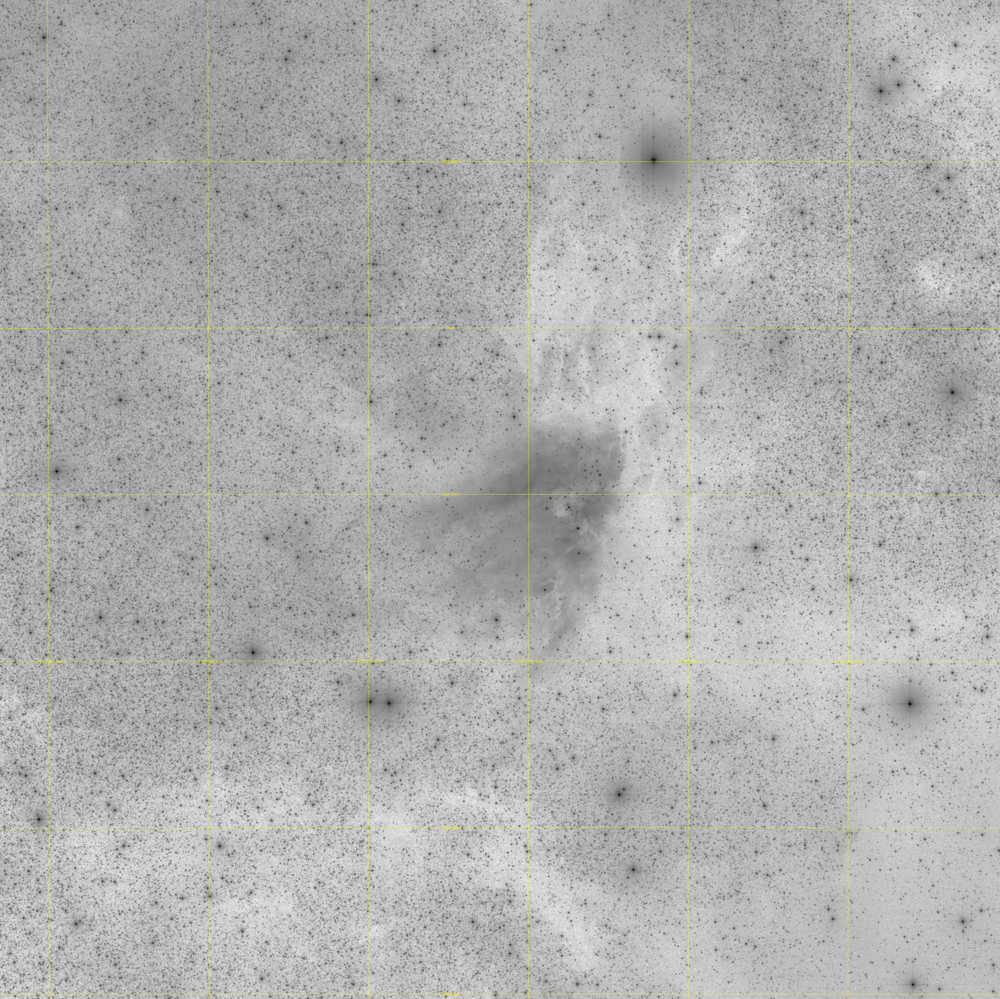

In [10]:
from IPython.display import Image

rtn = mViewer('-color yellow -grid eq j2000 \
               -ct 1 -gray work/good_hdr.fits -2s max gaussian-log \
               -out work/good_hdr.png', 
              '', mode=2 )

Image(filename='work/good_hdr.png')

Montage functions return JSON structures.  They always include a status (0: success; 1: error) and a variable number of informational parameters.


## Error Handling

If mGetHdr/mPutHdr encounter an error, the return structure will just have two elements: a status of 1 ("error") and a message string that tries to diagnose the reason for the error.

For instance, if the user asks for an invalid file:

In [12]:
rtn = mGetHdr("other/unknown.fits", "work/fix.hdr")

print(rtn)

{'status': '1', 'msg': b'Image file (other/unknown.fits) does not exist'}


&nbsp;

## Classic Montage: mArchiveExec as a Stand-Alone Program

### mGetHdr/mPutHdr Unix/Windows Command-line Arguments

<p>mGetHdr/mPutHdr can also be run as command-line tools in Linux, OS X, and Windows:</p>

<p><tt>
<b>Usage:</b> mGetHdr [-d][-h hdu][-s statusfile] img.fits img.hdr<br/>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;mPutHdr [-d level][-s statusfile][-h hdu] in.fits out.fits hdr.template
</tt></p>
<p>&nbsp;</p>
<p>If you are writing in C/C++, mGetHdr can be accessed as a library function:</p>


<pre>
/*-***********************************************************************/
/*                                                                       */
/*  mGetHdr                                                              */
/*                                                                       */
/*  This program extracts the FITS header from an image into a text file */
/*                                                                       */
/*   char  *infile         Input FITS file                               */
/*   char  *hdrfile        ASCII header stripped from the input, with    */
/*                         newlines added for readability                */
/*                                                                       */
/*   int    hdu            Optional HDU offset for input file            */
/*   int    htmlMode       Write output as an HTML file                  */
/*   int    debug          Debugging output level                        */
/*                                                                       */
/*************************************************************************/

struct mGetHdrReturn *mGetHdr(char *infile, char *hdrfile, int hdu, int htmlMode, int debug)
</pre>
<p><b>Return Structure</b></p>
<pre>
struct mGetHdrReturn
{
   int    status;        // Return status (0: OK, 1:ERROR)
   char   msg [1024];    // Return message (for error return)
   char   json[4096];    // Return parameters as JSON string
   int    ncard;         // Number of lines in the header.
};
</pre>